<a href="https://colab.research.google.com/github/umakrishna-2002/Sentimental-Analysis/blob/main/ml_sentiment_analyser.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [ ]:
df=pd.read_csv(r"N:\SEMESTER 5\ML 19cse305\Project\Hotel_Reviews.csv")

In [ ]:
df

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515733,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/30/2015,8.1,Atlantis Hotel Vienna,Kuwait,no trolly or staff to help you take the lugga...,14,2823,location,2,8,7.0,"[' Leisure trip ', ' Family with older childre...",704 day,48.203745,16.335677
515734,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/22/2015,8.1,Atlantis Hotel Vienna,Estonia,The hotel looks like 3 but surely not 4,11,2823,Breakfast was ok and we got earlier check in,11,12,5.8,"[' Leisure trip ', ' Family with young childre...",712 day,48.203745,16.335677
515735,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/19/2015,8.1,Atlantis Hotel Vienna,Egypt,The ac was useless It was a hot week in vienn...,19,2823,No Positive,0,3,2.5,"[' Leisure trip ', ' Family with older childre...",715 day,48.203745,16.335677
515736,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/17/2015,8.1,Atlantis Hotel Vienna,Mexico,No Negative,0,2823,The rooms are enormous and really comfortable...,25,3,8.8,"[' Leisure trip ', ' Group ', ' Standard Tripl...",717 day,48.203745,16.335677


### EXPLOLATORY DATA ANALYSIS

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Hotel_Address                               515738 non-null  object 
 1   Additional_Number_of_Scoring                515738 non-null  int64  
 2   Review_Date                                 515738 non-null  object 
 3   Average_Score                               515738 non-null  float64
 4   Hotel_Name                                  515738 non-null  object 
 5   Reviewer_Nationality                        515738 non-null  object 
 6   Negative_Review                             515738 non-null  object 
 7   Review_Total_Negative_Word_Counts           515738 non-null  int64  
 8   Total_Number_of_Reviews                     515738 non-null  int64  
 9   Positive_Review                             515738 non-null  object 
 

In [ ]:
df.isnull().sum()

Hotel_Address                                    0
Additional_Number_of_Scoring                     0
Review_Date                                      0
Average_Score                                    0
Hotel_Name                                       0
Reviewer_Nationality                             0
Negative_Review                                  0
Review_Total_Negative_Word_Counts                0
Total_Number_of_Reviews                          0
Positive_Review                                  0
Review_Total_Positive_Word_Counts                0
Total_Number_of_Reviews_Reviewer_Has_Given       0
Reviewer_Score                                   0
Tags                                             0
days_since_review                                0
lat                                           3268
lng                                           3268
dtype: int64

In [ ]:
df.describe()

,Additional_Number_of_Scoring,Average_Score,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,lat,lng
count,515738.000000,515738.000000,515738.000000,515738.000000,515738.000000,515738.000000,515738.000000,512470.000000,512470.000000
mean,498.081836,8.397487,18.539450,2743.743944,17.776458,7.166001,8.395077,49.442439,2.823803
std,500.538467,0.548048,29.690831,2317.464868,21.804185,11.040228,1.637856,3.466325,4.579425
min,1.000000,5.200000,0.000000,43.000000,0.000000,1.000000,2.500000,41.328376,-0.369758
25%,169.000000,8.100000,2.000000,1161.000000,5.000000,1.000000,7.500000,48.214662,-0.143372
50%,341.000000,8.400000,9.000000,2134.000000,11.000000,3.000000,8.800000,51.499981,0.010607
75%,660.000000,8.800000,23.000000,3613.000000,22.000000,8.000000,9.600000,51.516288,4.834443
max,2682.000000,9.800000,408.000000,16670.000000,395.000000,355.000000,10.000000,52.400181,16.429233


In [ ]:
df.shape

(515738, 17)

In [ ]:
df.columns

Index(['Hotel_Address', 'Additional_Number_of_Scoring', 'Review_Date',
       'Average_Score', 'Hotel_Name', 'Reviewer_Nationality',
       'Negative_Review', 'Review_Total_Negative_Word_Counts',
       'Total_Number_of_Reviews', 'Positive_Review',
       'Review_Total_Positive_Word_Counts',
       'Total_Number_of_Reviews_Reviewer_Has_Given', 'Reviewer_Score', 'Tags',
       'days_since_review', 'lat', 'lng'],
      dtype='object')

### DATA VISUALIZATION

<AxesSubplot:>

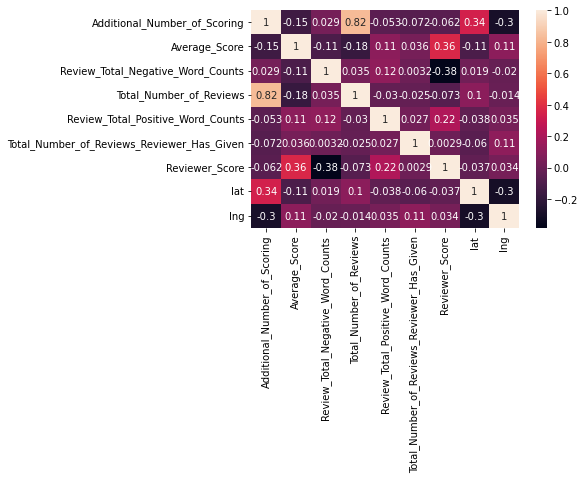

In [ ]:
corr=df.corr()
sns.heatmap(corr,annot=True)
#fint the correlation between attributes

<AxesSubplot:xlabel='Total_Number_of_Reviews', ylabel='Reviewer_Score'>

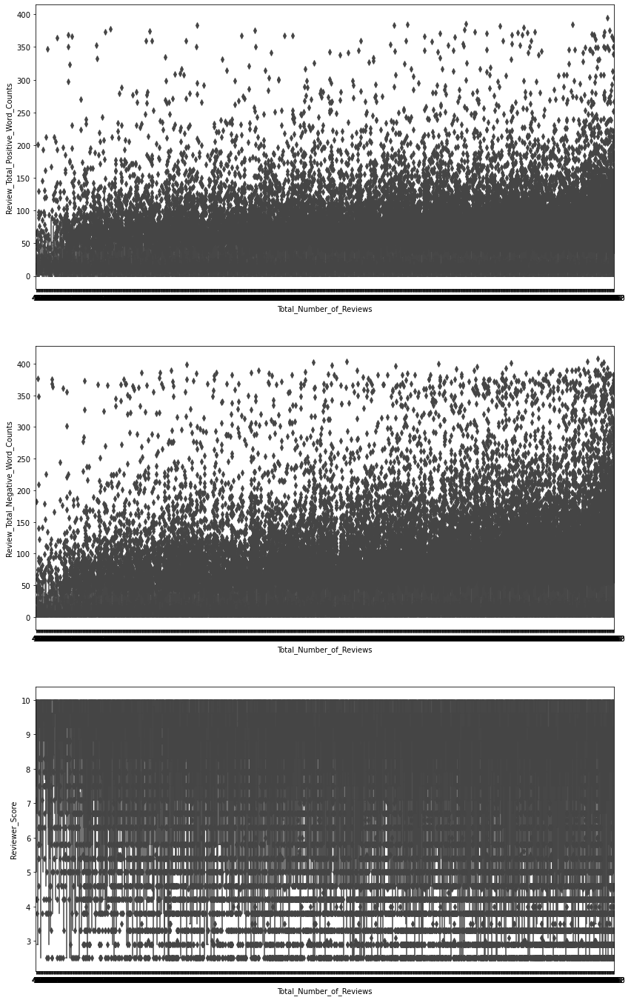

In [ ]:
plt.subplots(figsize = (14,24))
plt.subplot(3,1,1)
sns.boxplot(x=df['Total_Number_of_Reviews'],y=df['Review_Total_Positive_Word_Counts'])
plt.subplot(3,1,2)
sns.boxplot(x=df['Total_Number_of_Reviews'],y=df['Review_Total_Negative_Word_Counts'])
plt.subplot(3,1,3)
sns.boxplot(x=df['Total_Number_of_Reviews'],y=df['Reviewer_Score'])

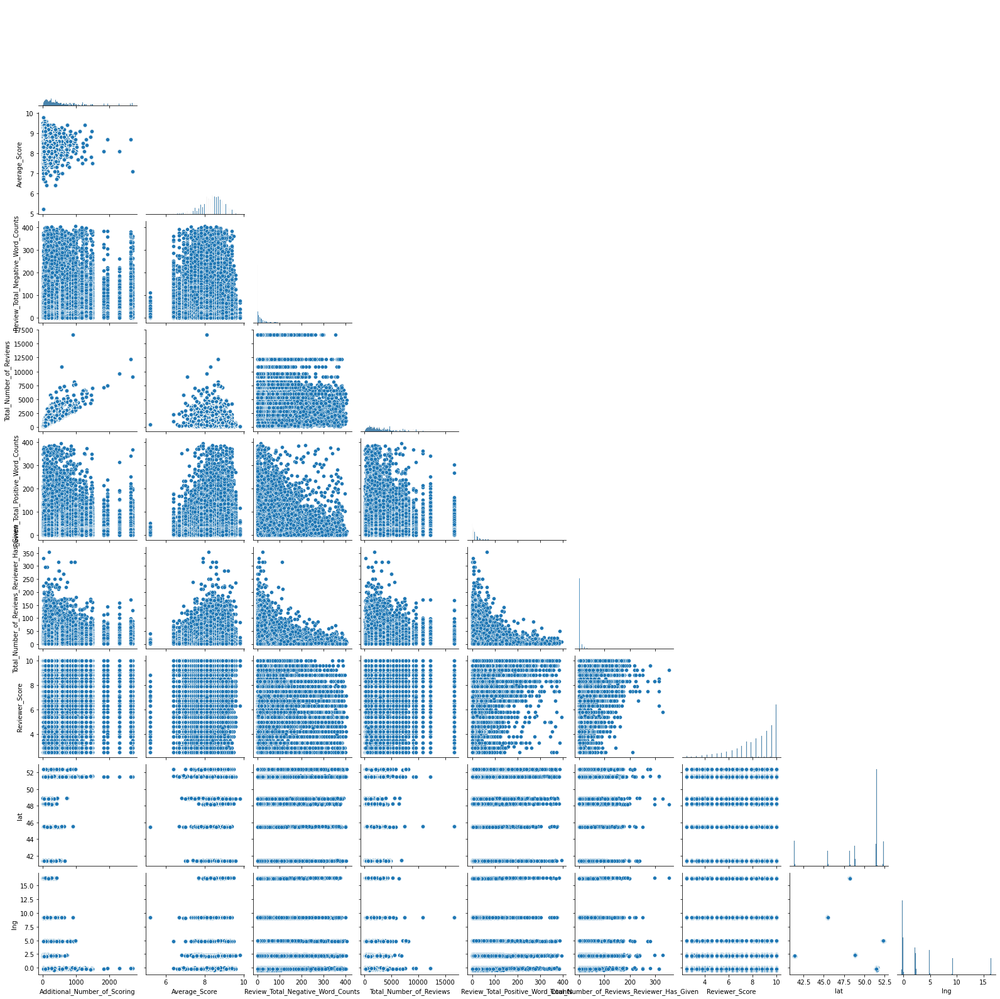

In [ ]:
sns.pairplot(df,corner=True)

<AxesSubplot:>

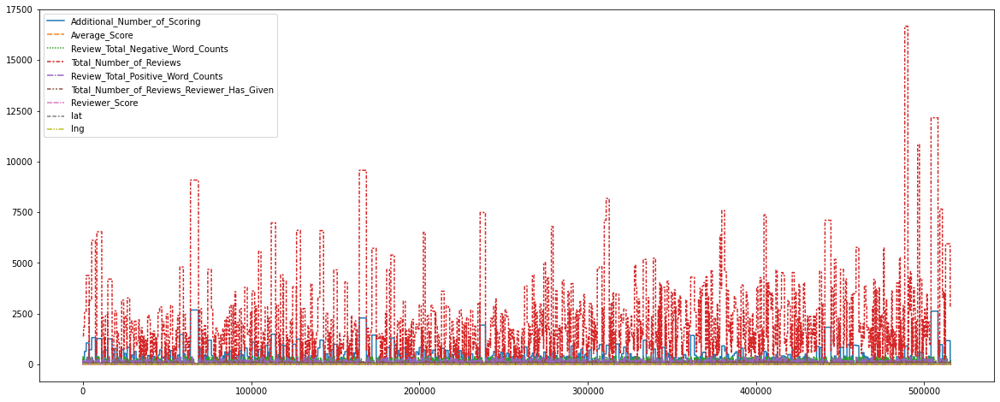

In [ ]:
plt.figure(figsize=(20,8))
sns.lineplot(data=df)

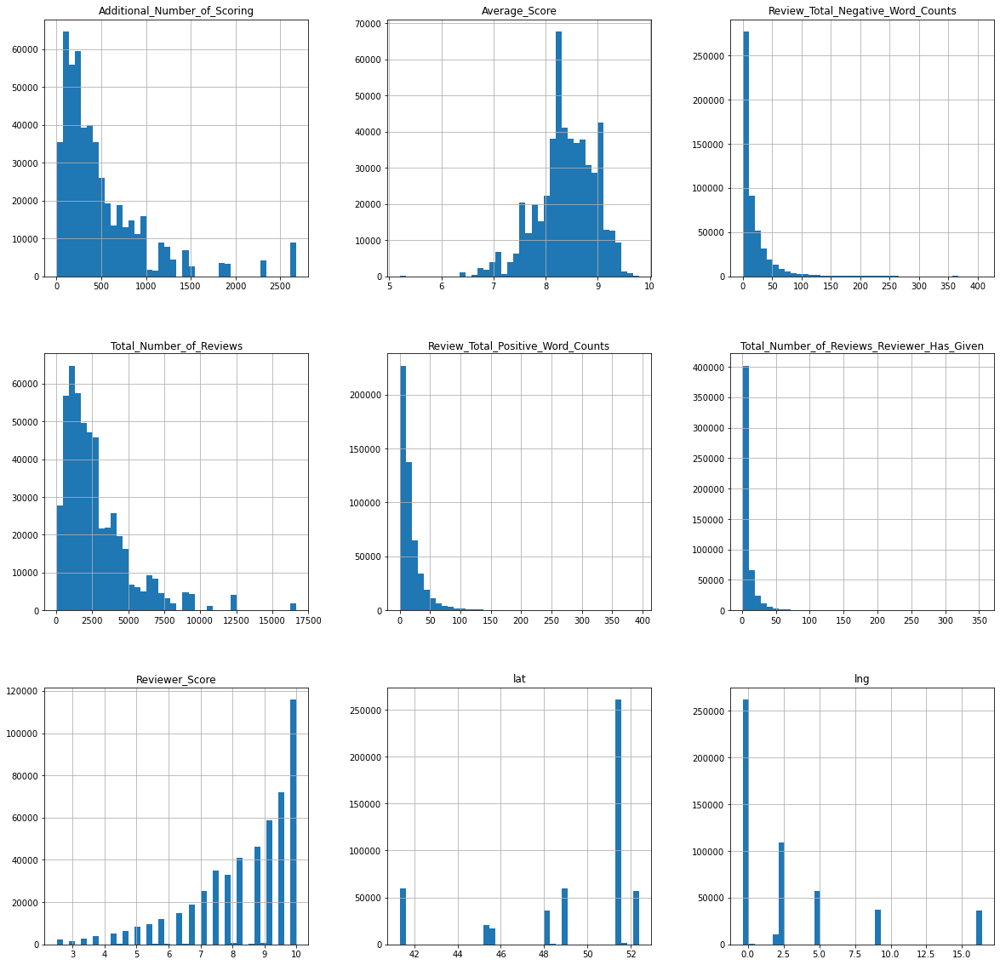

In [ ]:
df.hist(bins=40, figsize=(20,20))
plt.show()

### FEATURE ENGINEERING

In [ ]:
df["review"] = df["Negative_Review"] + df["Positive_Review"]
#combing the positive and negative reviews to form a single review(in a new column)

In [ ]:
df

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,review
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,I am so angry that i made this post available...
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,No Negative No real complaints the hotel was g...
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968,Rooms are nice but for elderly a bit difficul...
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968,My room was dirty and I was afraid to walk ba...
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968,You When I booked with your company on line y...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515733,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/30/2015,8.1,Atlantis Hotel Vienna,Kuwait,no trolly or staff to help you take the lugga...,14,2823,location,2,8,7.0,"[' Leisure trip ', ' Family with older childre...",704 day,48.203745,16.335677,no trolly or staff to help you take the lugga...
515734,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/22/2015,8.1,Atlantis Hotel Vienna,Estonia,The hotel looks like 3 but surely not 4,11,2823,Breakfast was ok and we got earlier check in,11,12,5.8,"[' Leisure trip ', ' Family with young childre...",712 day,48.203745,16.335677,The hotel looks like 3 but surely not 4 Brea...
515735,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/19/2015,8.1,Atlantis Hotel Vienna,Egypt,The ac was useless It was a hot week in vienn...,19,2823,No Positive,0,3,2.5,"[' Leisure trip ', ' Family with older childre...",715 day,48.203745,16.335677,The ac was useless It was a hot week in vienn...
515736,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/17/2015,8.1,Atlantis Hotel Vienna,Mexico,No Negative,0,2823,The rooms are enormous and really comfortable...,25,3,8.8,"[' Leisure trip ', ' Group ', ' Standard Tripl...",717 day,48.203745,16.335677,No Negative The rooms are enormous and really ...


In [ ]:
df1 = df.iloc[:,17:18]
df1

,review
0,I am so angry that i made this post available...
1,No Negative No real complaints the hotel was g...
2,Rooms are nice but for elderly a bit difficul...
3,My room was dirty and I was afraid to walk ba...
4,You When I booked with your company on line y...
...,...
515733,no trolly or staff to help you take the lugga...
515734,The hotel looks like 3 but surely not 4 Brea...
515735,The ac was useless It was a hot week in vienn...
515736,No Negative The rooms are enormous and really ...


In [ ]:
sentiment_array=np.array(df1)
sentiment_array

array([[' I am so angry that i made this post available via all possible sites i use when planing my trips so no one will make the mistake of booking this place I made my booking via booking com We stayed for 6 nights in this hotel from 11 to 17 July Upon arrival we were placed in a small room on the 2nd floor of the hotel It turned out that this was not the room we booked I had specially reserved the 2 level duplex room so that we would have a big windows and high ceilings The room itself was ok if you don t mind the broken window that can not be closed hello rain and a mini fridge that contained some sort of a bio weapon at least i guessed so by the smell of it I intimately asked to change the room and after explaining 2 times that i booked a duplex btw it costs the same as a simple double but got way more volume due to the high ceiling was offered a room but only the next day SO i had to check out the next day before 11 o clock in order to get the room i waned to Not the best way to

In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import nltk

In [ ]:
sent_analyzer = SentimentIntensityAnalyzer()
sentiment_score=[]
for i in range(0,515738):
    x=sent_analyzer.polarity_scores(sentiment_array[i-1])
    sentiment_score.append(x['compound'])

In [ ]:
print(sentiment_score)

[0.7902, -0.8649, 0.9697, 0.9019, 0.9355, 0.5263, 0.9247, 0.9337, 0.9491, 0.5076, 0.8221, 0.9788, -0.8979, 0.0, 0.9682, 0.584, 0.9961, 0.928, 0.9842, 0.5717, 0.8957, 0.4019, -0.8439, -0.3255, 0.9842, 0.9732, 0.9761, 0.9975, 0.8885, 0.8883, 0.9604, 0.9284, 0.894, -0.511, 0.7287, 0.926, 0.979, -0.6501, 0.2229, 0.9945, 0.6709, 0.9457, 0.9741, -0.5523, 0.7669, -0.5719, 0.9091, 0.9795, 0.9779, 0.9535, -0.3421, 0.8526, 0.1531, 0.9744, 0.961, 0.743, 0.9778, 0.3999, 0.976, 0.8977, 0.9907, 0.8591, 0.4927, 0.9786, -0.0498, 0.9272, 0.4391, 0.813, 0.9774, 0.9552, 0.9642, 0.9547, 0.8737, 0.25, 0.9679, 0.9224, 0.9523, 0.92, 0.8591, 0.9759, 0.9432, 0.926, 0.9601, 0.9517, 0.9422, 0.5221, 0.9833, 0.9281, -0.6247, 0.6258, -0.5431, -0.8777, 0.4019, -0.7096, 0.4931, 0.7351, 0.9963, 0.9118, 0.9022, -0.9173, 0.8589, -0.6124, 0.7096, 0.9595, 0.9831, 0.9676, 0.5717, 0.9545, -0.7298, 0.8685, 0.7269, 0.836, 0.7197, 0.8607, 0.9547, 0.9564, 0.8737, 0.7964, 0.9826, 0.9627, 0.4917, 0.7237, -0.0951, 0.3814, 0.9856, 

In [ ]:
sentiment=pd.DataFrame(sentiment_score)
sentiment.describe()

,0
count,515738.000000
mean,0.516632
std,0.489961
min,-0.997500
25%,0.256225
50%,0.718400
75%,0.900200
max,0.999400


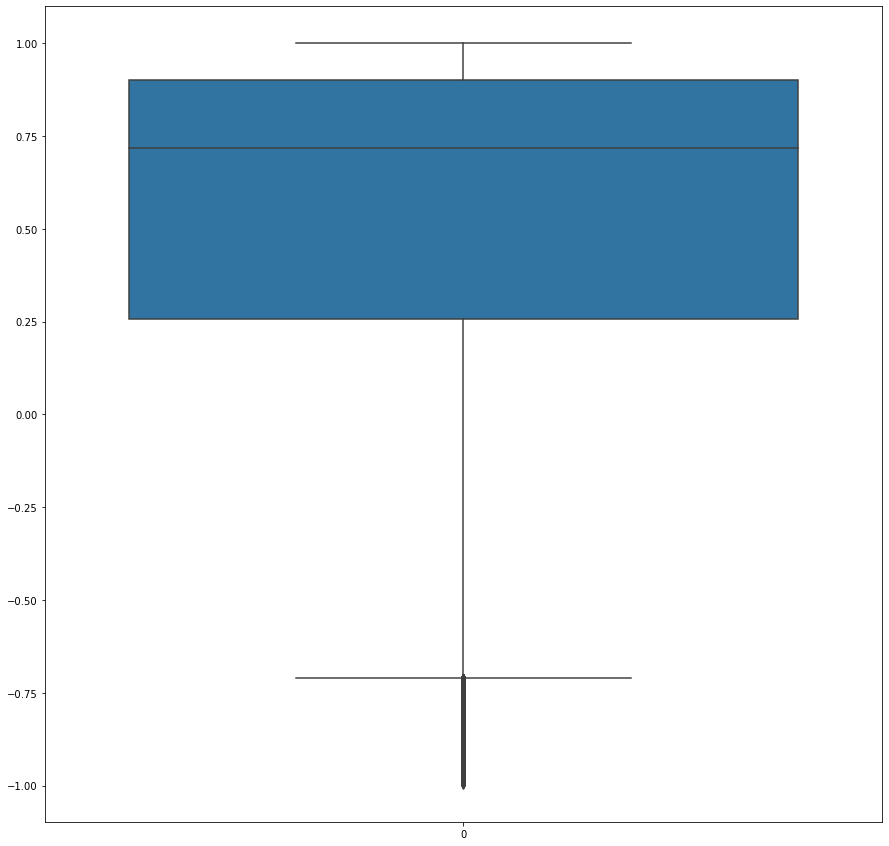

In [ ]:
plt.figure(figsize=(15,15))
sns.boxplot(data=sentiment)
plt.show()

In [ ]:
df_final =  pd.concat([df, sentiment], axis=1, join='inner')

In [ ]:
df_final

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,review,0
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,I am so angry that i made this post available...,0.7902
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,No Negative No real complaints the hotel was g...,-0.8649
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968,Rooms are nice but for elderly a bit difficul...,0.9697
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968,My room was dirty and I was afraid to walk ba...,0.9019
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968,You When I booked with your company on line y...,0.9355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515733,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/30/2015,8.1,Atlantis Hotel Vienna,Kuwait,no trolly or staff to help you take the lugga...,14,2823,location,2,8,7.0,"[' Leisure trip ', ' Family with older childre...",704 day,48.203745,16.335677,no trolly or staff to help you take the lugga...,0.1695
515734,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/22/2015,8.1,Atlantis Hotel Vienna,Estonia,The hotel looks like 3 but surely not 4,11,2823,Breakfast was ok and we got earlier check in,11,12,5.8,"[' Leisure trip ', ' Family with young childre...",712 day,48.203745,16.335677,The hotel looks like 3 but surely not 4 Brea...,0.1280
515735,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/19/2015,8.1,Atlantis Hotel Vienna,Egypt,The ac was useless It was a hot week in vienn...,19,2823,No Positive,0,3,2.5,"[' Leisure trip ', ' Family with older childre...",715 day,48.203745,16.335677,The ac was useless It was a hot week in vienn...,0.8126
515736,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/17/2015,8.1,Atlantis Hotel Vienna,Mexico,No Negative,0,2823,The rooms are enormous and really comfortable...,25,3,8.8,"[' Leisure trip ', ' Group ', ' Standard Tripl...",717 day,48.203745,16.335677,No Negative The rooms are enormous and really ...,0.2648


In [ ]:
new_data_sentiment=df_final.rename(columns={0: "Sentiment_score"})

In [ ]:
new_data_sentiment

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,review,Sentiment_score
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,I am so angry that i made this post available...,0.7902
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,No Negative No real complaints the hotel was g...,-0.8649
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968,Rooms are nice but for elderly a bit difficul...,0.9697
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968,My room was dirty and I was afraid to walk ba...,0.9019
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968,You When I booked with your company on line y...,0.9355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515733,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/30/2015,8.1,Atlantis Hotel Vienna,Kuwait,no trolly or staff to help you take the lugga...,14,2823,location,2,8,7.0,"[' Leisure trip ', ' Family with older childre...",704 day,48.203745,16.335677,no trolly or staff to help you take the lugga...,0.1695
515734,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/22/2015,8.1,Atlantis Hotel Vienna,Estonia,The hotel looks like 3 but surely not 4,11,2823,Breakfast was ok and we got earlier check in,11,12,5.8,"[' Leisure trip ', ' Family with young childre...",712 day,48.203745,16.335677,The hotel looks like 3 but surely not 4 Brea...,0.1280
515735,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/19/2015,8.1,Atlantis Hotel Vienna,Egypt,The ac was useless It was a hot week in vienn...,19,2823,No Positive,0,3,2.5,"[' Leisure trip ', ' Family with older childre...",715 day,48.203745,16.335677,The ac was useless It was a hot week in vienn...,0.8126
515736,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/17/2015,8.1,Atlantis Hotel Vienna,Mexico,No Negative,0,2823,The rooms are enormous and really comfortable...,25,3,8.8,"[' Leisure trip ', ' Group ', ' Standard Tripl...",717 day,48.203745,16.335677,No Negative The rooms are enormous and really ...,0.2648


In [ ]:
new_data_sentiment.columns

Index(['Hotel_Address', 'Additional_Number_of_Scoring', 'Review_Date',
       'Average_Score', 'Hotel_Name', 'Reviewer_Nationality',
       'Negative_Review', 'Review_Total_Negative_Word_Counts',
       'Total_Number_of_Reviews', 'Positive_Review',
       'Review_Total_Positive_Word_Counts',
       'Total_Number_of_Reviews_Reviewer_Has_Given', 'Reviewer_Score', 'Tags',
       'days_since_review', 'lat', 'lng', 'review', 'Sentiment_score'],
      dtype='object')

In [ ]:
sent=np.array(new_data_sentiment['Sentiment_score'])
sent

array([ 0.7902, -0.8649,  0.9697, ...,  0.8126,  0.2648,  0.7817])

conditions for lables:
-0.25 --- .25 avg
-.75 --- -.25 bad
<-.75 aweful
.25 --- .75 gud
->.75 excellent

In [ ]:
cust_sentiment=[]
for i in range(0,515738):
    if(sent[i]>0.75):
        cust_sentiment.append("Excellent")
    elif(sent[i]>=.25):
        cust_sentiment.append("Good")
    elif(sent[i]>=-0.25):
        cust_sentiment.append("Average")
    elif(sent[i]>=-0.75):
        cust_sentiment.append("Bad")
    else:
        cust_sentiment.append("Awful")


In [ ]:
print(cust_sentiment)

['Excellent', 'Awful', 'Excellent', 'Excellent', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Awful', 'Average', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Excellent', 'Good', 'Excellent', 'Good', 'Awful', 'Bad', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Bad', 'Good', 'Excellent', 'Excellent', 'Bad', 'Average', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Bad', 'Excellent', 'Bad', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Bad', 'Excellent', 'Average', 'Excellent', 'Excellent', 'Good', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Good', 'Excellent', 'Average', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Good', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Excellent', 'Good', 'E

In [ ]:
customer=pd.DataFrame(cust_sentiment)

In [ ]:
sent_analyser=pd.concat([new_data_sentiment, customer], axis=1, join='inner')

In [ ]:
sent_analyser=sent_analyser.rename(columns={0: "Customer_sentiment"})
sent_analyser

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,review,Sentiment_score,Customer_sentiment
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,I am so angry that i made this post available...,0.7902,Excellent
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,08-03-2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,No Negative No real complaints the hotel was g...,-0.8649,Awful
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968,Rooms are nice but for elderly a bit difficul...,0.9697,Excellent
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968,My room was dirty and I was afraid to walk ba...,0.9019,Excellent
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968,You When I booked with your company on line y...,0.9355,Excellent
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515733,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/30/2015,8.1,Atlantis Hotel Vienna,Kuwait,no trolly or staff to help you take the lugga...,14,2823,location,2,8,7.0,"[' Leisure trip ', ' Family with older childre...",704 day,48.203745,16.335677,no trolly or staff to help you take the lugga...,0.1695,Average
515734,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/22/2015,8.1,Atlantis Hotel Vienna,Estonia,The hotel looks like 3 but surely not 4,11,2823,Breakfast was ok and we got earlier check in,11,12,5.8,"[' Leisure trip ', ' Family with young childre...",712 day,48.203745,16.335677,The hotel looks like 3 but surely not 4 Brea...,0.1280,Average
515735,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/19/2015,8.1,Atlantis Hotel Vienna,Egypt,The ac was useless It was a hot week in vienn...,19,2823,No Positive,0,3,2.5,"[' Leisure trip ', ' Family with older childre...",715 day,48.203745,16.335677,The ac was useless It was a hot week in vienn...,0.8126,Excellent
515736,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/17/2015,8.1,Atlantis Hotel Vienna,Mexico,No Negative,0,2823,The rooms are enormous and really comfortable...,25,3,8.8,"[' Leisure trip ', ' Group ', ' Standard Tripl...",717 day,48.203745,16.335677,No Negative The rooms are enormous and really ...,0.2648,Good


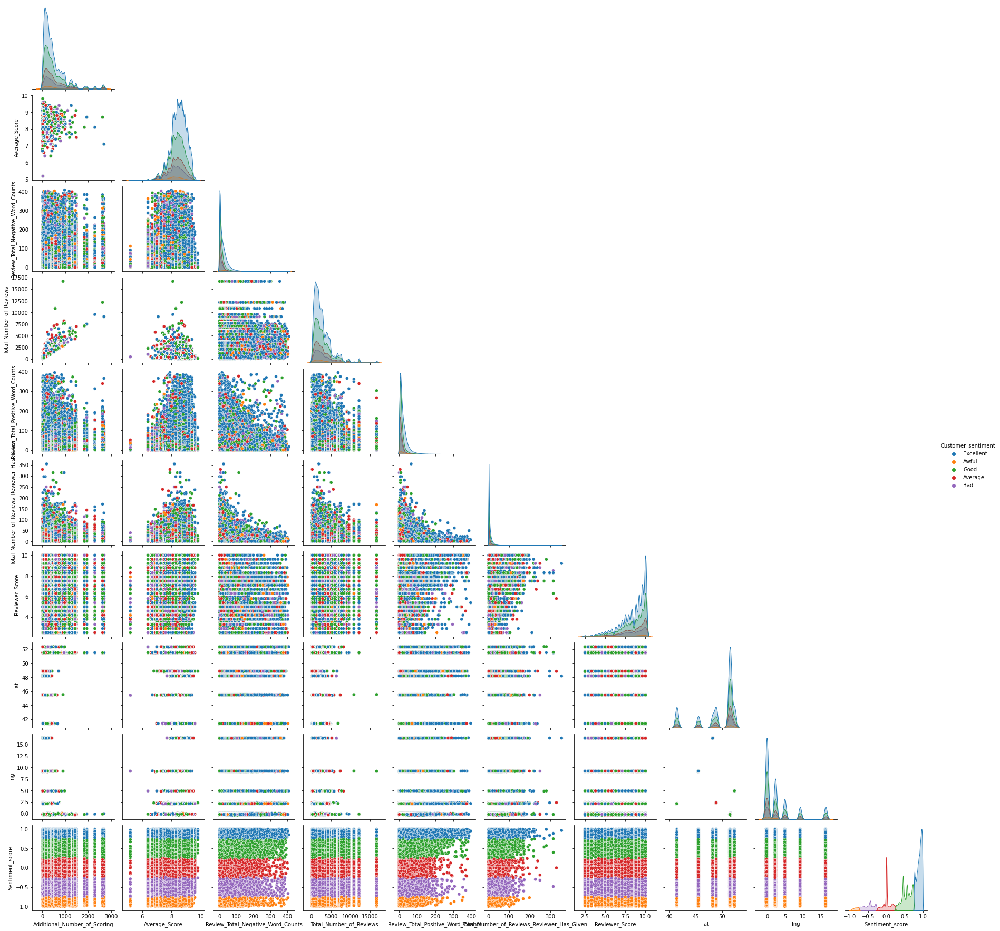

In [ ]:
sns.pairplot(data=sent_analyser,hue='Customer_sentiment',corner=True)

In [ ]:
sent_analyser=sent_analyser.drop(columns=["Additional_Number_of_Scoring","Reviewer_Nationality","Negative_Review","Review_Total_Negative_Word_Counts","Positive_Review","Review_Total_Positive_Word_Counts","Tags","days_since_review","lat","lng"])

In [ ]:
sent_analyser=sent_analyser.drop(columns=["Review_Date","Total_Number_of_Reviews_Reviewer_Has_Given"])

In [ ]:
sent_analyser

,Hotel_Address,Average_Score,Hotel_Name,Total_Number_of_Reviews,Reviewer_Score,review,Sentiment_score,Customer_sentiment
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,7.7,Hotel Arena,1403,2.9,I am so angry that i made this post available...,0.7902,Excellent
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,7.7,Hotel Arena,1403,7.5,No Negative No real complaints the hotel was g...,-0.8649,Awful
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,7.7,Hotel Arena,1403,7.1,Rooms are nice but for elderly a bit difficul...,0.9697,Excellent
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,7.7,Hotel Arena,1403,3.8,My room was dirty and I was afraid to walk ba...,0.9019,Excellent
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,7.7,Hotel Arena,1403,6.7,You When I booked with your company on line y...,0.9355,Excellent
...,...,...,...,...,...,...,...,...
515733,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,8.1,Atlantis Hotel Vienna,2823,7.0,no trolly or staff to help you take the lugga...,0.1695,Average
515734,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,8.1,Atlantis Hotel Vienna,2823,5.8,The hotel looks like 3 but surely not 4 Brea...,0.1280,Average
515735,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,8.1,Atlantis Hotel Vienna,2823,2.5,The ac was useless It was a hot week in vienn...,0.8126,Excellent
515736,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,8.1,Atlantis Hotel Vienna,2823,8.8,No Negative The rooms are enormous and really ...,0.2648,Good


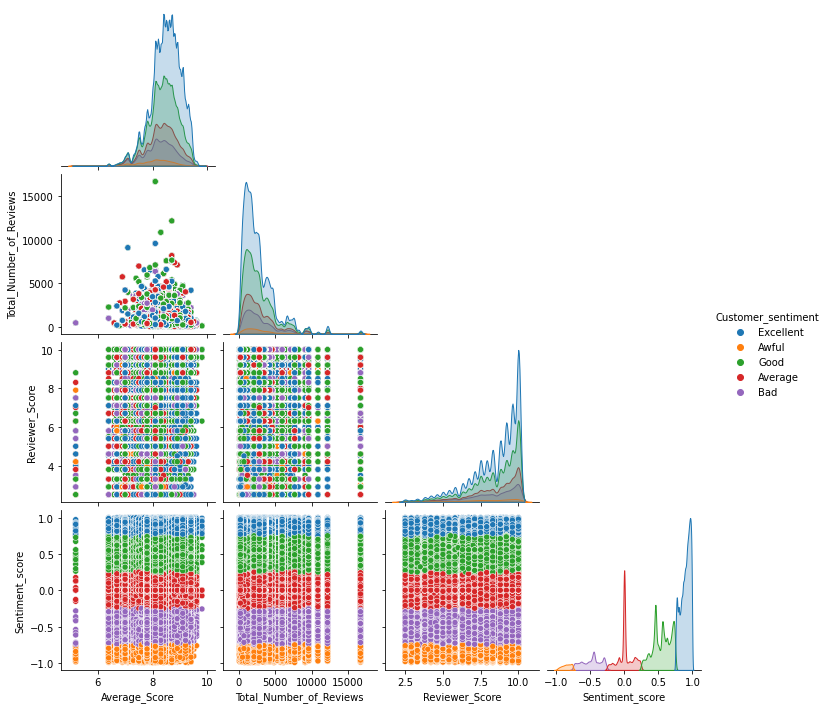

In [ ]:
sns.pairplot(sent_analyser,hue="Customer_sentiment",corner=True)

In [ ]:
from sklearn.model_selection import train_test_split
X=sent_analyser[['Average_Score','Reviewer_Score','Sentiment_score']]
y=sent_analyser['Customer_sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y,train_size=0.7, random_state = 0)

In [ ]:


from sklearn.svm import SVC
svm_model = SVC(gamma='auto').fit(X_train, y_train)
svm_predictions = svm_model.predict(X_test)

acc_train = svm_model.score(X_train, y_train)
acc_test = svm_model.score(X_test, y_test)
print(acc_train,"accuracy for train")
print(acc_test,"accuracy for test")

0.9958035100937355 accuracy for train
0.9956761158723387 accuracy for test


In [ ]:
svm=pd.DataFrame(svm_predictions)

In [ ]:
sent_analyser['Customer_sentiment']

0         Excellent
1             Awful
2         Excellent
3         Excellent
4         Excellent
            ...    
515733      Average
515734      Average
515735    Excellent
515736         Good
515737    Excellent
Name: Customer_sentiment, Length: 515738, dtype: object

In [ ]:
svm

,0
0,Good
1,Excellent
2,Excellent
3,Excellent
4,Good
...,...
154717,Excellent
154718,Bad
154719,Awful
154720,Excellent


In [ ]:
from sklearn import tree

In [ ]:
D_tree = tree.DecisionTreeClassifier(criterion="entropy")
D_tree.fit(X_train, y_train)
a=D_tree.score(X_train, y_train)
y_pred = D_tree.predict(X_test)
b=D_tree.score(X_test, y_test)
print(a,b)

1.0 1.0


[Text(0.7142857142857143, 0.9, 'X[2] <= 0.75\nentropy = 1.849\nsamples = 361016\nvalue = [50294, 7756, 31362, 169492, 102112]'),
 Text(0.5714285714285714, 0.7, 'X[2] <= 0.25\nentropy = 1.605\nsamples = 191524\nvalue = [50294, 7756, 31362, 0, 102112]'),
 Text(0.42857142857142855, 0.5, 'X[2] <= -0.25\nentropy = 1.303\nsamples = 89412\nvalue = [50294, 7756, 31362, 0, 0]'),
 Text(0.2857142857142857, 0.3, 'X[2] <= -0.75\nentropy = 0.718\nsamples = 39118\nvalue = [0, 7756, 31362, 0, 0]'),
 Text(0.14285714285714285, 0.1, 'entropy = 0.0\nsamples = 7756\nvalue = [0, 7756, 0, 0, 0]'),
 Text(0.42857142857142855, 0.1, 'entropy = 0.0\nsamples = 31362\nvalue = [0, 0, 31362, 0, 0]'),
 Text(0.5714285714285714, 0.3, 'entropy = 0.0\nsamples = 50294\nvalue = [50294, 0, 0, 0, 0]'),
 Text(0.7142857142857143, 0.5, 'entropy = 0.0\nsamples = 102112\nvalue = [0, 0, 0, 0, 102112]'),
 Text(0.8571428571428571, 0.7, 'entropy = 0.0\nsamples = 169492\nvalue = [0, 0, 0, 169492, 0]')]

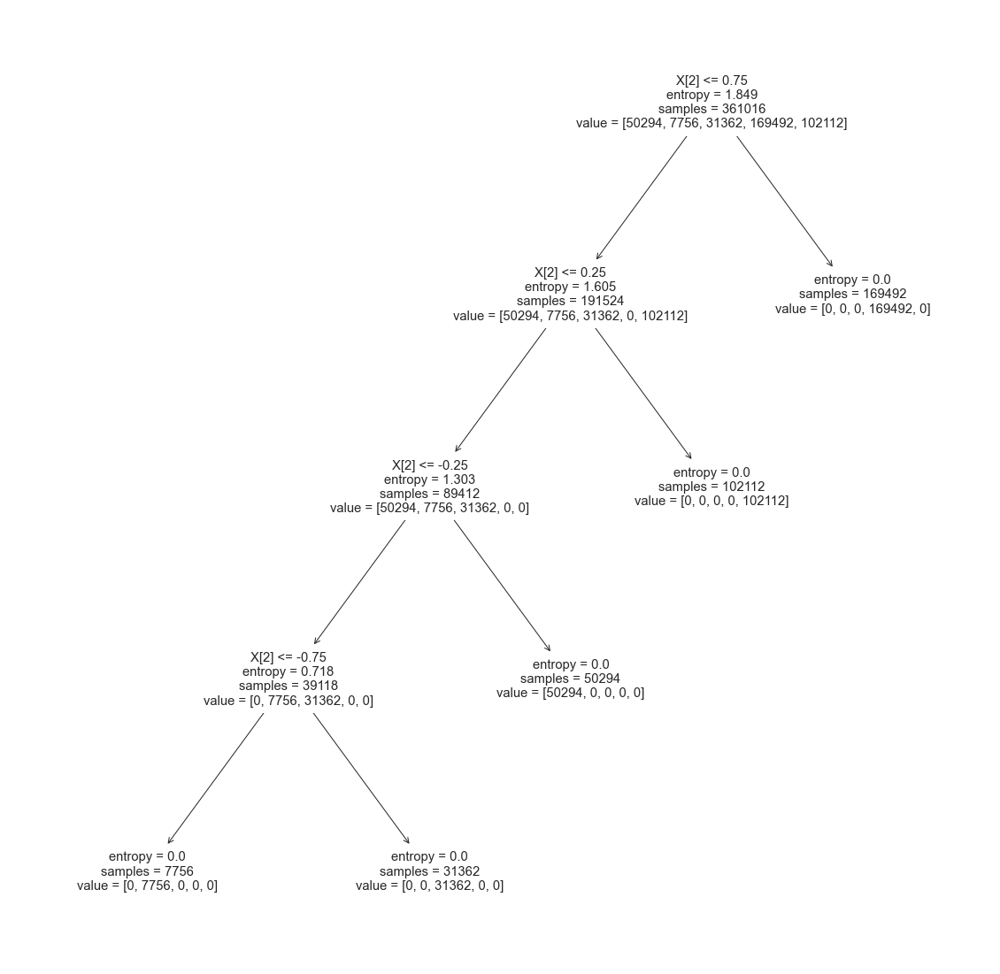

In [ ]:
plt.figure(figsize=(20,20))
from sklearn import tree
tree.plot_tree(D_tree.fit(X_train, y_train))

In [ ]:
# from sklearn.metrics import confusion_matrix
# cf=confusion_matrix(y_test, y_pred, labels = [1,0])
# sns.heatmap(cf,annot=True)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

     Average       1.00      1.00      1.00     21655
       Awful       1.00      1.00      1.00      3250
         Bad       1.00      1.00      1.00     13409
   Excellent       1.00      1.00      1.00     72756
        Good       1.00      1.00      1.00     43652

    accuracy                           1.00    154722
   macro avg       1.00      1.00      1.00    154722
weighted avg       1.00      1.00      1.00    154722



In [ ]:
import plotly.express as px

In [ ]:
xtest=[99,100,100,91,96,97]
x1=pd.DataFrame(xtest)

In [ ]:
x1.rename(columns={0:'Accuracy'})

,Accuracy
0,99
1,100
2,100
3,91
4,96
5,97


In [ ]:
ytest=['SVM','D-Tree','Random Forest','KNN','GNB','MLPC']
y1=pd.DataFrame(ytest)

In [ ]:
y1.rename(columns={0:'Model'})

,Model
0,SVM
1,D-Tree
2,Random Forest
3,KNN
4,GNB
5,MLPC


In [ ]:
ml_bar_graph=pd.concat([x1,y1],axis=1,join='inner')

In [ ]:
ml_bar_graph

,0,0
0,99,SVM
1,100,D-Tree
2,100,Random Forest
3,91,KNN
4,96,GNB
5,97,MLPC


In [ ]:
plt.bar(ml_bar_graph,x=ml_bar_graph.iloc[:,2:],y=ml_bar_graph.iloc[:,:1],height=100)

TypeError: bar() got multiple values for argument 'x'

In [ ]:
ml_bar_graph=ml_bar_graph.drop(ml_bar_graph.iloc[:,1:])

In [ ]:
ml_bar_graph

,0,0
1,100,D-Tree
2,100,Random Forest
3,91,KNN
4,96,GNB
5,97,MLPC


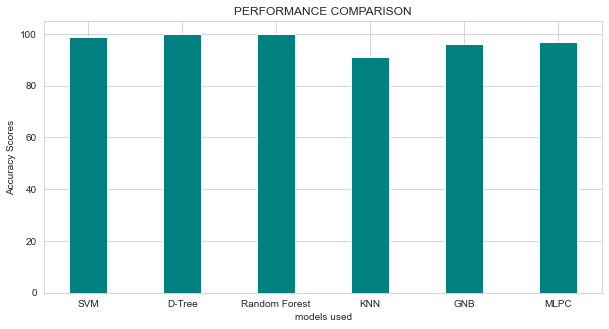

In [ ]:
data = {'SVM':99, 'D-Tree':100, 'Random Forest':100,'KNN':91,'GNB':96,"MLPC":97}
models = list(data.keys())
accuracy = list(data.values())
fig = plt.figure(figsize = (10, 5))
plt.bar(models, accuracy, color ='teal',width = 0.4)
plt.xlabel("models used")
plt.ylabel("Accuracy Scores")
plt.title("PERFORMANCE COMPARISON")
plt.show()
